In [1]:
%reset -f

In [2]:
!nvidia-smi

Sun Nov 24 19:48:48 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  On   | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/faces-unq-bin/CelebAfaces_onlyone_target_uint32.bin
/kaggle/input/faces-unq-bin/LFWfaces_noalign_onlyone_target_uint32.bin
/kaggle/input/faces-unq-bin/Mergefaces_onlyone_target_uint32.bin
/kaggle/input/faces-unq-bin/Mergefaces_onlyone_dataset_15926x3x64x64_uint8.bin
/kaggle/input/faces-unq-bin/CelebAfaces_onlyone_dataset_10177x3x64x64_uint8.bin
/kaggle/input/faces-unq-bin/LFWfaces_noalign_onlyone_dataset_5749x3x64x64_uint8.bin
/kaggle/input/faces-unq-bin/checkpoint_0210.pth


In [4]:
import numpy as np

import torch
import torchvision
from torch import nn

from time import time
import subprocess
from datetime import timedelta
from tqdm import tqdm

from matplotlib import pyplot as plt
import seaborn as sns

sns.set()
%matplotlib inline

In [5]:
start_time = time()

In [6]:
torch.backends.cudnn.benchmark = True

In [7]:
def get_gpu_memory_used():
    result = subprocess.check_output(
        ['nvidia-smi', '--query-gpu=memory.used', '--format=csv,noheader,nounits'])
    return int(result)

def get_gpu_memory_total():
    result = subprocess.check_output(
        ['nvidia-smi', '--query-gpu=memory.total', '--format=csv,noheader,nounits'])
    return int(result)    

def get_gpu_memory_free():
    result = subprocess.check_output(
        ['nvidia-smi', '--query-gpu=memory.free', '--format=csv,noheader,nounits'])
    return int(result)    

In [8]:
def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.0)

In [9]:
def image_qc(img, syn):
    fig, ax  = plt.subplots(figsize=(26, 26), nrows = 1, ncols = 2)
    ax[0].imshow(torchvision.utils.make_grid(img.detach(), padding = 8, nrow = 8).permute(1, 2, 0))
    ax[1].imshow(torchvision.utils.make_grid(syn.detach(), padding = 8, nrow = 8).permute(1, 2, 0))

    for a in ax:
        a.get_xaxis().set_visible(False)
        a.get_yaxis().set_visible(False)

    plt.show()

In [10]:
img_raw = torch.from_numpy(np.fromfile('/kaggle/input/faces-unq-bin/LFWfaces_noalign_onlyone_dataset_5749x3x64x64_uint8.bin', dtype = np.uint8).reshape(-1,3,64,64))
trg_raw = torch.from_numpy(np.fromfile('/kaggle/input/faces-unq-bin/LFWfaces_noalign_onlyone_target_uint32.bin', dtype = np.uint32).astype(np.int32))

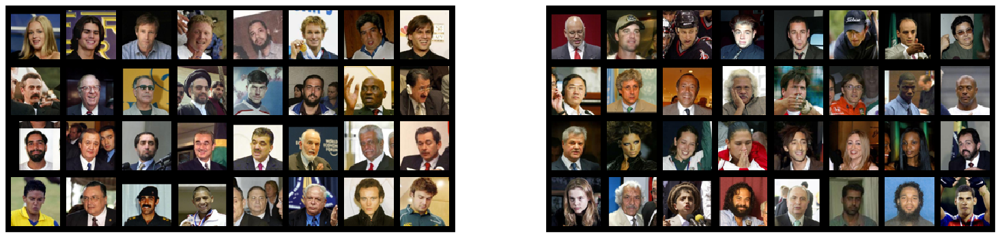

In [11]:
image_qc(img_raw[:32], img_raw[32:64])

In [12]:
batch_size = 32
train_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(img_raw, trg_raw), batch_size=batch_size, shuffle = True) # shuffle turned to true after 210 itrs

In [13]:
num_feat = 512
num_dim = 400

In [14]:
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.cnn_encode_layers = nn.Sequential(
            nn.Conv2d(3, num_feat * 4, kernel_size = 5, padding = 0, stride = 2, bias = False),
            nn.BatchNorm2d(num_feat * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(num_feat * 4, num_feat * 3, kernel_size = 3, padding = 1, stride = 1, bias = False),
            nn.BatchNorm2d(num_feat * 3),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(num_feat * 3, num_feat * 2, kernel_size = 3, padding = 0, stride = 2, bias = False),
            nn.BatchNorm2d(num_feat * 2),
            nn.LeakyReLU(0.2, inplace=True))

        self.linear_encode_layers = nn.Sequential(
            nn.Linear(num_feat * 2 * 14 * 14, num_dim))

        self.linear_encode_layers.apply(init_weights)

    def forward(self, x):
        x = self.cnn_encode_layers(x)
        x = x.view(-1, num_feat * 2 * 14 * 14)
        x = self.linear_encode_layers(x)

        return x

In [15]:
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.linear_decode_layers = nn.Sequential(
            nn.Linear(num_dim, num_feat * 2 * 14 * 14),
            nn.ReLU(True))

        self.cnn_decode_layers = nn.Sequential(
            nn.ConvTranspose2d(num_feat * 2, num_feat * 3, kernel_size = 4, stride = 2, bias = False),
            nn.BatchNorm2d(num_feat * 3),
            nn.ReLU(True),

            nn.ConvTranspose2d(num_feat * 3, num_feat * 4, kernel_size = 3, stride = 1, bias = False, padding = 1),
            nn.BatchNorm2d(num_feat * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(num_feat * 4, 3, kernel_size = 6, stride = 2, bias = False),
            nn.Sigmoid())

        self.linear_decode_layers.apply(init_weights)

    def forward(self, x):
        x = self.linear_decode_layers(x)
        x = x.view(-1, num_feat * 2, 14, 14)
        x = self.cnn_decode_layers(x)
        
        return x

In [16]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.discriminator = nn.Sequential(nn.Linear(num_dim, num_dim),
                                           nn.ReLU(),
                                           nn.Linear(num_dim, num_dim//2),
                                           nn.ReLU(),
                                           nn.Linear(num_dim//2, 1))

        self.discriminator.apply(init_weights)
        
    def forward(self, x):
        return self.discriminator(x)

In [17]:
start_epoch = 210
end_epoch = 300

#lam = 7.5e-4
lam = 1e-3

encoder = Encoder()
decoder = Decoder()
discriminator = Discriminator()

use_gpu = torch.cuda.is_available()

if use_gpu:
    encoder = encoder.cuda()
    decoder = decoder.cuda()
    discriminator = discriminator.cuda()
    print("Using GPU")
else:
    print("Using CPU")

# learning rates changed from 1e-3 after 120 itrs
encoder_solver = torch.optim.Adam(encoder.parameters(), lr = 1e-4)
decoder_solver = torch.optim.Adam(decoder.parameters(), lr = 1e-4)

discriminator_solver = torch.optim.Adam(discriminator.parameters(), lr = 1e-4)

recon_criterion = nn.MSELoss()
discriminator_criterion = nn.BCEWithLogitsLoss() 
generator_criterion = nn.BCEWithLogitsLoss()

Using GPU


In [18]:
def save_model(epoch, r_loss, d_loss):
    torch.save({'encoder': encoder.state_dict(),
                'decoder': decoder.state_dict(),
                'discriminator': discriminator.state_dict(),
                
                'encoder_solver': encoder_solver.state_dict(),
                'decoder_solver': decoder_solver.state_dict(),
                'discriminator_solver': discriminator_solver.state_dict(),

                'r_loss': r_loss,
                'd_loss': d_loss,
               },
                'checkpoint_{:04d}.pth'.format(epoch))

In [19]:
def load_model(epoch):
    checkpoint = torch.load('/kaggle/input/faces-unq-bin/checkpoint_{:04d}.pth'.format(epoch))

    encoder.load_state_dict(checkpoint['encoder'])
    decoder.load_state_dict(checkpoint['decoder'])
    discriminator.load_state_dict(checkpoint['discriminator'])

    encoder_solver.load_state_dict(checkpoint['encoder_solver'])
    decoder_solver.load_state_dict(checkpoint['decoder_solver'])
    discriminator_solver.load_state_dict(checkpoint['discriminator_solver'])

    r_loss = checkpoint['r_loss']
    d_loss = checkpoint['d_loss']

    encoder.train()
    decoder.train()
    discriminator.train()
    
    return r_loss, d_loss

211 █████████████████ 180/180 [03:08<00:00, 1.05s/it] R Loss:2.44343e-03, D Loss:1.33310e-03, GPU: 8.15 GB (50.1 %)
212 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:2.14989e-03, D Loss:1.34482e-03, GPU: 9.59 GB (58.9 %)
213 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:2.09448e-03, D Loss:1.33690e-03, GPU: 9.59 GB (58.9 %)
214 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.94607e-03, D Loss:1.35897e-03, GPU: 9.59 GB (58.9 %)


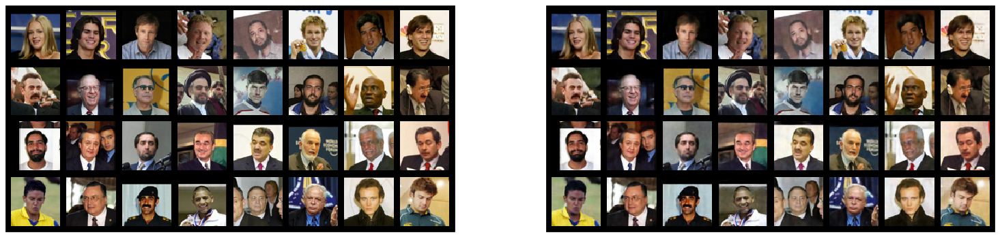

215 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:2.00782e-03, D Loss:1.35196e-03, GPU: 9.59 GB (58.9 %)
216 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:2.08570e-03, D Loss:1.34580e-03, GPU: 9.59 GB (58.9 %)
217 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:2.18055e-03, D Loss:1.34451e-03, GPU: 9.59 GB (58.9 %)
218 █████████████████ 180/180 [02:59<00:00, 0.99s/it] R Loss:1.82582e-03, D Loss:1.37440e-03, GPU: 9.59 GB (58.9 %)
219 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.69489e-03, D Loss:1.37584e-03, GPU: 9.59 GB (58.9 %)


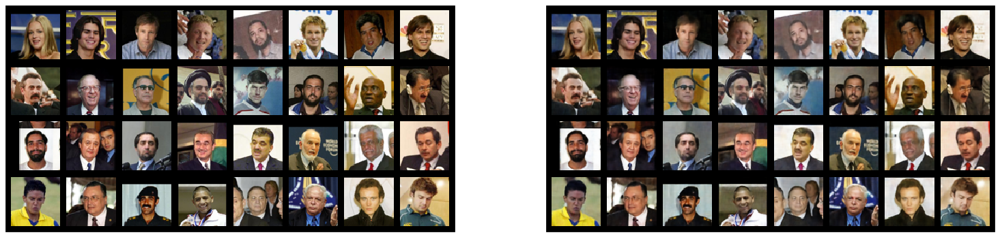

220 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.64006e-03, D Loss:1.38221e-03, GPU: 9.59 GB (58.9 %)
221 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.55702e-03, D Loss:1.38836e-03, GPU: 9.59 GB (58.9 %)
222 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.51637e-03, D Loss:1.39159e-03, GPU: 9.59 GB (58.9 %)
223 █████████████████ 180/180 [02:57<00:00, 0.99s/it] R Loss:1.51388e-03, D Loss:1.38268e-03, GPU: 9.59 GB (58.9 %)
224 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.49316e-03, D Loss:1.38692e-03, GPU: 9.59 GB (58.9 %)


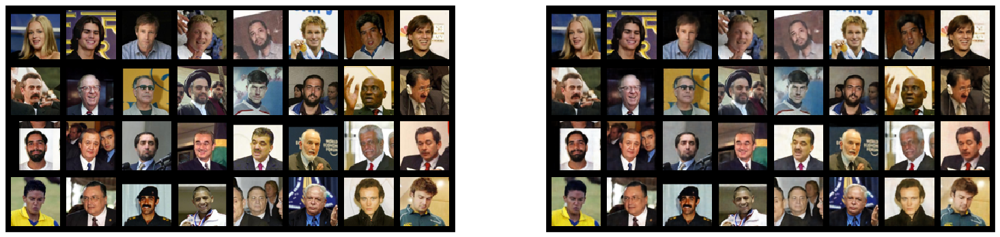

225 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.46730e-03, D Loss:1.38909e-03, GPU: 9.59 GB (58.9 %)
226 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.48325e-03, D Loss:1.38179e-03, GPU: 9.59 GB (58.9 %)
227 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.47481e-03, D Loss:1.38214e-03, GPU: 9.59 GB (58.9 %)
228 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.46347e-03, D Loss:1.38361e-03, GPU: 9.59 GB (58.9 %)
229 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.59824e-03, D Loss:1.37013e-03, GPU: 9.59 GB (58.9 %)


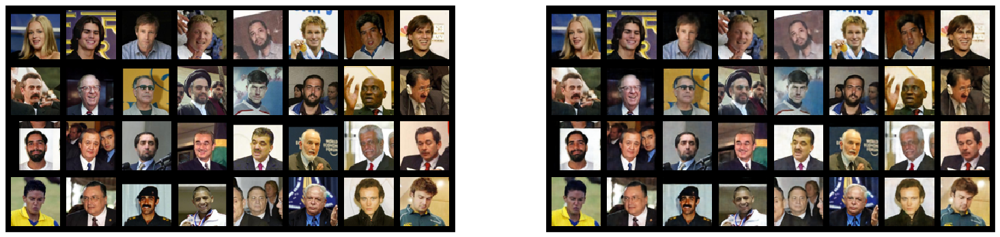

230 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.54156e-03, D Loss:1.37936e-03, GPU: 9.59 GB (58.9 %)
231 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.49469e-03, D Loss:1.38514e-03, GPU: 9.59 GB (58.9 %)
232 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.47171e-03, D Loss:1.38496e-03, GPU: 9.59 GB (58.9 %)
233 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.43456e-03, D Loss:1.38635e-03, GPU: 9.59 GB (58.9 %)
234 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.41302e-03, D Loss:1.38524e-03, GPU: 9.59 GB (58.9 %)


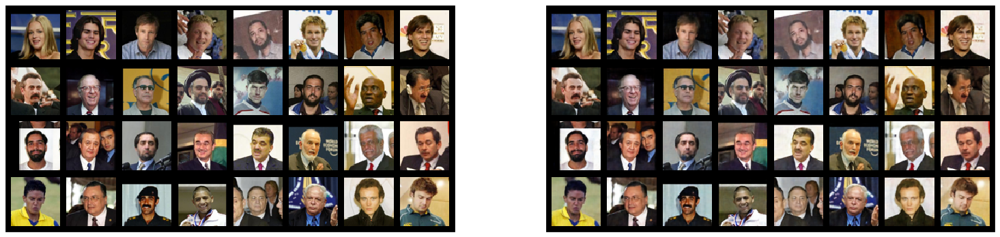

235 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.39292e-03, D Loss:1.38297e-03, GPU: 9.59 GB (58.9 %)
236 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.38040e-03, D Loss:1.38526e-03, GPU: 9.59 GB (58.9 %)
237 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.38710e-03, D Loss:1.38377e-03, GPU: 9.59 GB (58.9 %)
238 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.39616e-03, D Loss:1.38123e-03, GPU: 9.59 GB (58.9 %)
239 █████████████████ 180/180 [02:58<00:00, 0.99s/it] R Loss:1.38970e-03, D Loss:1.38239e-03, GPU: 9.59 GB (58.9 %)


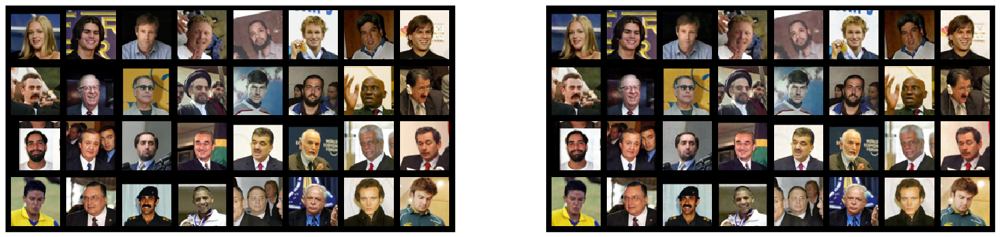

240 █████████████████ 180/180 [02:59<00:00, 0.99s/it] R Loss:1.37566e-03, D Loss:1.38467e-03, GPU: 9.59 GB (58.9 %)
241 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.70784e-03, D Loss:1.35829e-03, GPU: 9.59 GB (58.9 %)
242 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.90294e-03, D Loss:1.34569e-03, GPU: 9.59 GB (58.9 %)
243 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.62654e-03, D Loss:1.37358e-03, GPU: 9.59 GB (58.9 %)
244 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.46337e-03, D Loss:1.38445e-03, GPU: 9.59 GB (58.9 %)


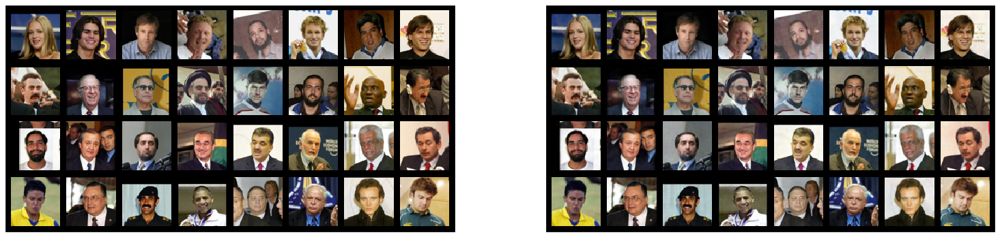

245 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.42453e-03, D Loss:1.38114e-03, GPU: 9.59 GB (58.9 %)
246 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.36086e-03, D Loss:1.38867e-03, GPU: 9.59 GB (58.9 %)
247 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.32940e-03, D Loss:1.38958e-03, GPU: 9.59 GB (58.9 %)
248 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.30104e-03, D Loss:1.38880e-03, GPU: 9.59 GB (58.9 %)
249 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.28330e-03, D Loss:1.38805e-03, GPU: 9.59 GB (58.9 %)


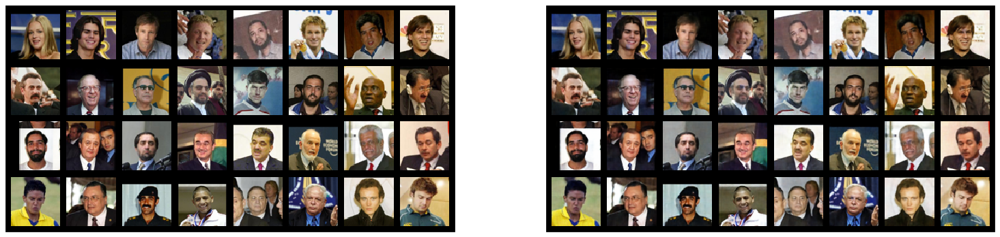

250 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.28303e-03, D Loss:1.38557e-03, GPU: 9.59 GB (58.9 %)
251 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.27495e-03, D Loss:1.38357e-03, GPU: 9.59 GB (58.9 %)
252 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.26996e-03, D Loss:1.38647e-03, GPU: 9.59 GB (58.9 %)
253 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.27812e-03, D Loss:1.38363e-03, GPU: 9.59 GB (58.9 %)
254 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.26968e-03, D Loss:1.38430e-03, GPU: 9.59 GB (58.9 %)


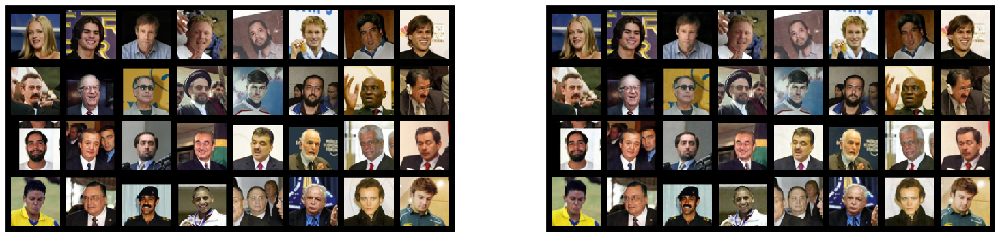

255 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.26622e-03, D Loss:1.38517e-03, GPU: 9.59 GB (58.9 %)
256 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.28204e-03, D Loss:1.38405e-03, GPU: 9.59 GB (58.9 %)
257 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.27912e-03, D Loss:1.38252e-03, GPU: 9.59 GB (58.9 %)
258 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.28583e-03, D Loss:1.38400e-03, GPU: 9.59 GB (58.9 %)
259 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.30216e-03, D Loss:1.38377e-03, GPU: 9.59 GB (58.9 %)


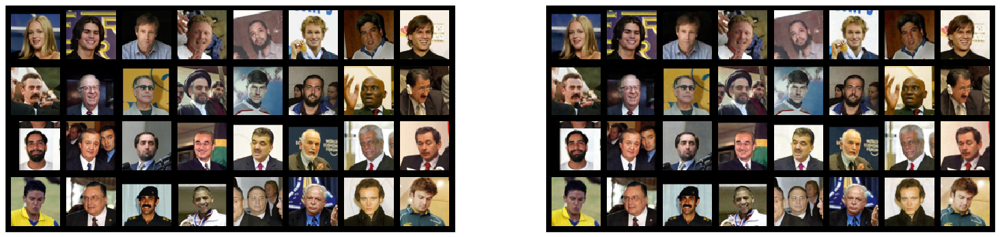

260 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.28210e-03, D Loss:1.38443e-03, GPU: 9.59 GB (58.9 %)
261 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.27811e-03, D Loss:1.38391e-03, GPU: 9.59 GB (58.9 %)
262 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.27900e-03, D Loss:1.38455e-03, GPU: 9.59 GB (58.9 %)
263 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.45870e-03, D Loss:1.36627e-03, GPU: 9.59 GB (58.9 %)
264 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.46806e-03, D Loss:1.37895e-03, GPU: 9.59 GB (58.9 %)


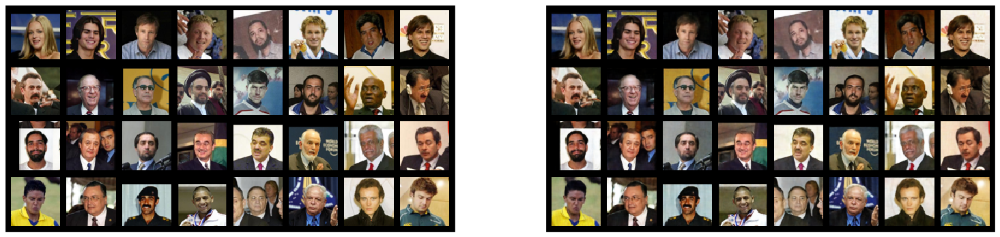

265 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.37156e-03, D Loss:1.38277e-03, GPU: 9.59 GB (58.9 %)
266 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.40979e-03, D Loss:1.38037e-03, GPU: 9.59 GB (58.9 %)
267 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.30202e-03, D Loss:1.38626e-03, GPU: 9.59 GB (58.9 %)
268 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.22178e-03, D Loss:1.38918e-03, GPU: 9.59 GB (58.9 %)
269 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.19816e-03, D Loss:1.38910e-03, GPU: 9.59 GB (58.9 %)


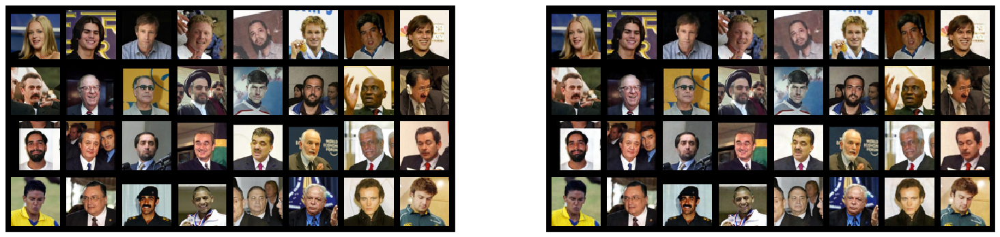

270 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18557e-03, D Loss:1.38606e-03, GPU: 9.59 GB (58.9 %)
271 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.17191e-03, D Loss:1.38589e-03, GPU: 9.59 GB (58.9 %)
272 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18889e-03, D Loss:1.38391e-03, GPU: 9.59 GB (58.9 %)
273 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18116e-03, D Loss:1.38603e-03, GPU: 9.59 GB (58.9 %)
274 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.19764e-03, D Loss:1.38442e-03, GPU: 9.59 GB (58.9 %)


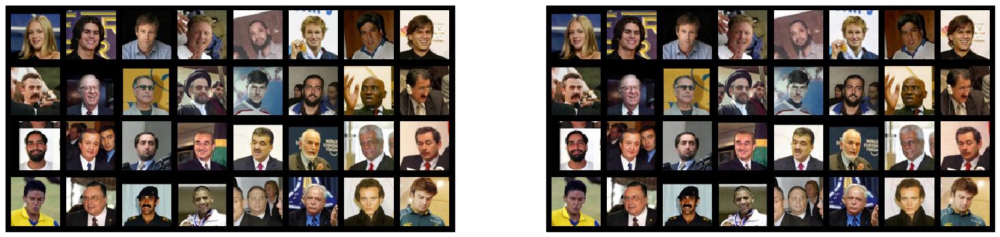

275 █████████████████ 180/180 [03:01<00:00, 1.01s/it] R Loss:1.20211e-03, D Loss:1.38592e-03, GPU: 9.59 GB (58.9 %)
276 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18452e-03, D Loss:1.38685e-03, GPU: 9.59 GB (58.9 %)
277 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.20405e-03, D Loss:1.38305e-03, GPU: 9.59 GB (58.9 %)
278 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.21739e-03, D Loss:1.38520e-03, GPU: 9.59 GB (58.9 %)
279 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.22311e-03, D Loss:1.38466e-03, GPU: 9.59 GB (58.9 %)


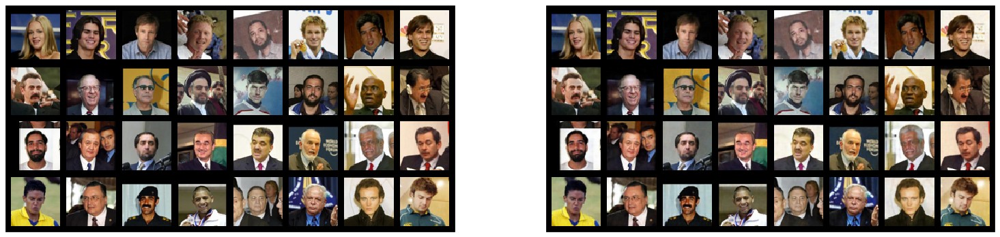

280 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.20544e-03, D Loss:1.38574e-03, GPU: 9.59 GB (58.9 %)
281 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.19918e-03, D Loss:1.38590e-03, GPU: 9.59 GB (58.9 %)
282 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.19158e-03, D Loss:1.38660e-03, GPU: 9.59 GB (58.9 %)
283 █████████████████ 180/180 [02:59<00:00, 1.00s/it] R Loss:1.18141e-03, D Loss:1.38629e-03, GPU: 9.59 GB (58.9 %)
284 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18702e-03, D Loss:1.38400e-03, GPU: 9.59 GB (58.9 %)


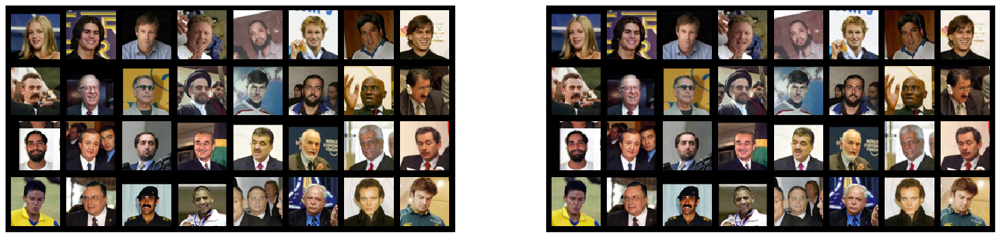

285 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.18564e-03, D Loss:1.38428e-03, GPU: 9.59 GB (58.9 %)
286 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.17304e-03, D Loss:1.38705e-03, GPU: 9.59 GB (58.9 %)
287 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.17208e-03, D Loss:1.38741e-03, GPU: 9.59 GB (58.9 %)
288 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.32496e-03, D Loss:1.37222e-03, GPU: 9.59 GB (58.9 %)
289 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.96114e-03, D Loss:1.31973e-03, GPU: 9.59 GB (58.9 %)


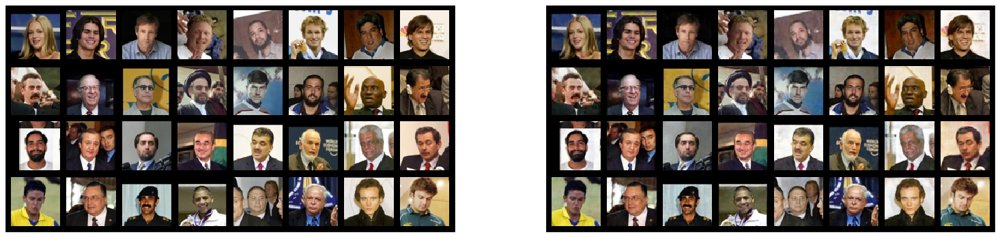

290 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.76813e-03, D Loss:1.36121e-03, GPU: 9.59 GB (58.9 %)
291 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.41394e-03, D Loss:1.38794e-03, GPU: 9.59 GB (58.9 %)
292 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.23452e-03, D Loss:1.39255e-03, GPU: 9.59 GB (58.9 %)
293 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.14037e-03, D Loss:1.39599e-03, GPU: 9.59 GB (58.9 %)
294 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.10418e-03, D Loss:1.39188e-03, GPU: 9.59 GB (58.9 %)


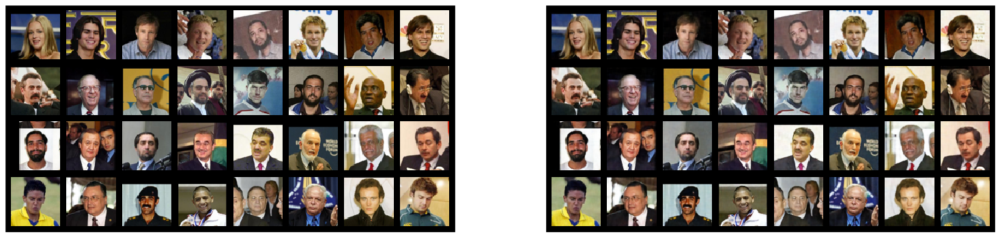

295 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.07760e-03, D Loss:1.39093e-03, GPU: 9.59 GB (58.9 %)
296 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.07305e-03, D Loss:1.39019e-03, GPU: 9.59 GB (58.9 %)
297 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.07060e-03, D Loss:1.38810e-03, GPU: 9.59 GB (58.9 %)
298 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.07118e-03, D Loss:1.38901e-03, GPU: 9.59 GB (58.9 %)
299 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.06746e-03, D Loss:1.38658e-03, GPU: 9.59 GB (58.9 %)


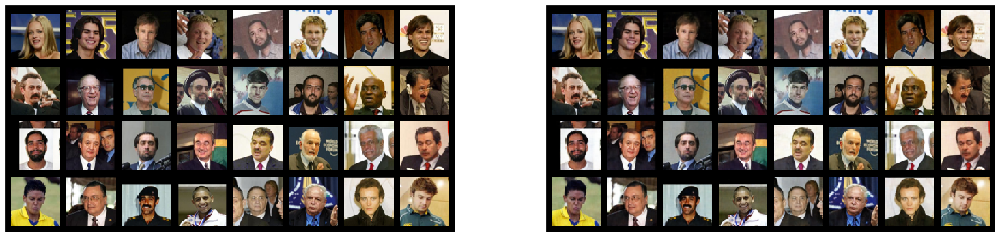

300 █████████████████ 180/180 [03:00<00:00, 1.00s/it] R Loss:1.07508e-03, D Loss:1.38577e-03, GPU: 9.59 GB (58.9 %)


In [20]:
recon = []
disrm = []

if start_epoch > 0:
    recon, disrm = load_model(start_epoch)
    start_epoch += 1

for epoch in range(start_epoch, end_epoch + 1):

    tot_recon_loss = np.float32(0.)
    tot_discrim_loss = np.float32(0.)

    if (epoch % 5 == 0):
        with torch.no_grad():
            qc_dat = img_raw[:32].float() / 255.
            if use_gpu:
                qc_dat = qc_dat.cuda()
            qc_enc = encoder(qc_dat)
            qc_rec = decoder(qc_enc)

            image_qc(qc_dat.detach().cpu().reshape(*qc_dat.size()), qc_rec.detach().cpu().reshape(*qc_rec.size()))
    
    if use_gpu:
        bar_format="{postfix[0][epoch]:>2d} {bar} {n_fmt}/{total_fmt} [{elapsed}<{remaining},\
{rate_inv_fmt}] R Loss:{postfix[0][rloss]:>8.5e}, D Loss:{postfix[0][dloss]:>8.5e}, GPU: {postfix[0][gpu_mem]:>0.2f} GB ({postfix[0][gpu_per]:>4.1f} %)"
        postfix=[dict(epoch = epoch, dloss = 0., rloss = 0., gpu_mem = get_gpu_memory_used() / 1000, gpu_per = get_gpu_memory_used() / get_gpu_memory_total() * 100)]
    else:
        bar_format="{postfix[0][epoch]:>2d} {bar} {n_fmt}/{total_fmt} [{elapsed}<{remaining},\
{rate_inv_fmt}] R Loss:{postfix[0][rloss]:>8.5e}, D Loss:{postfix[0][dloss]:>8.5e}"
        postfix=[dict(epoch = epoch, dloss = 0., rloss = 0.)]
    
    pbar = tqdm(train_loader, miniters = 10, leave = True, ncols = 115, 
        bar_format=bar_format, postfix=postfix)
    
    for batch_idx, (data, target) in enumerate(pbar):

        num_smpl = data.size(0)

        data = data.float() / 255.

        if use_gpu:
            data, target = data.cuda(), target.cuda()

        sample_enc = encoder(data)
        sample_tru = torch.as_tensor(np.random.standard_normal(num_smpl * num_dim).reshape(num_smpl, num_dim).astype('f4')).requires_grad_(True)

        if use_gpu:
            sample_tru = sample_tru.cuda()
        
        data_recon = decoder(sample_enc)

        discrim_enc = discriminator(sample_enc)
        discrim_tru = discriminator(sample_tru)
    
        ones_labels = torch.ones(num_smpl, 1, dtype = torch.float32, requires_grad = False)
        zeros_labels = torch.zeros(num_smpl, 1, dtype = torch.float32, requires_grad = False)

        if use_gpu:
            ones_labels, zeros_labels = ones_labels.cuda(), zeros_labels.cuda()

        discriminator_solver.zero_grad()

        discrim_loss = lam * (discriminator_criterion(discrim_tru, ones_labels) + discriminator_criterion(discrim_enc, zeros_labels))

        discrim_loss.backward(retain_graph=True)
        discriminator_solver.step()

        encoder_solver.zero_grad()
        decoder_solver.zero_grad()

        recon_loss = recon_criterion(data_recon, data) + lam * generator_criterion(discrim_enc, ones_labels)

        recon_loss.backward()

        encoder_solver.step()
        decoder_solver.step()
        
        tot_recon_loss += recon_loss.item() * num_smpl
        tot_discrim_loss += discrim_loss.item() * num_smpl

        if batch_idx < (len(train_loader) - 1):
            pbar.postfix[0]["dloss"] = discrim_loss.item()
            pbar.postfix[0]["rloss"] = recon_loss.item()
            
            if use_gpu:
                pbar.postfix[0]["gpu_mem"] = get_gpu_memory_used() / 1000
                pbar.postfix[0]["gpu_per"] = get_gpu_memory_used() / get_gpu_memory_total() * 100
        else:
            tot_recon_loss /= len(train_loader.dataset)
            tot_discrim_loss /= len(train_loader.dataset)

            pbar.postfix[0]["dloss"] = tot_discrim_loss.item()
            pbar.postfix[0]["rloss"] = tot_recon_loss.item()

            if use_gpu:
                pbar.postfix[0]["gpu_mem"] = get_gpu_memory_used() / 1000
                pbar.postfix[0]["gpu_per"] = get_gpu_memory_used() / get_gpu_memory_total() * 100
            
    recon.append(tot_recon_loss)
    disrm.append(tot_discrim_loss)
    
#     if ((epoch % 30) == 0) and (epoch > 0):
#         save_model(epoch, recon, disrm)
            
    if (time() - start_time) > (5.5 * 3600):
        break
    elif (tot_recon_loss < 7.5e-4):
        break

In [21]:
save_model(epoch, recon, disrm)

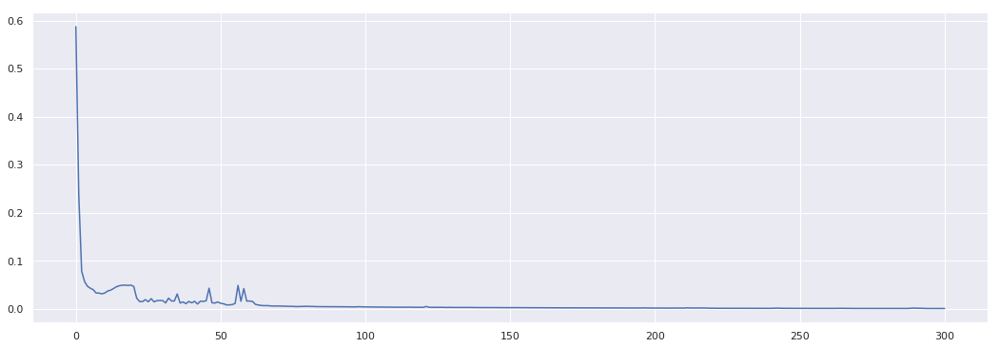

In [22]:
fig = plt.figure(figsize = (18,6))
plt.plot(recon)

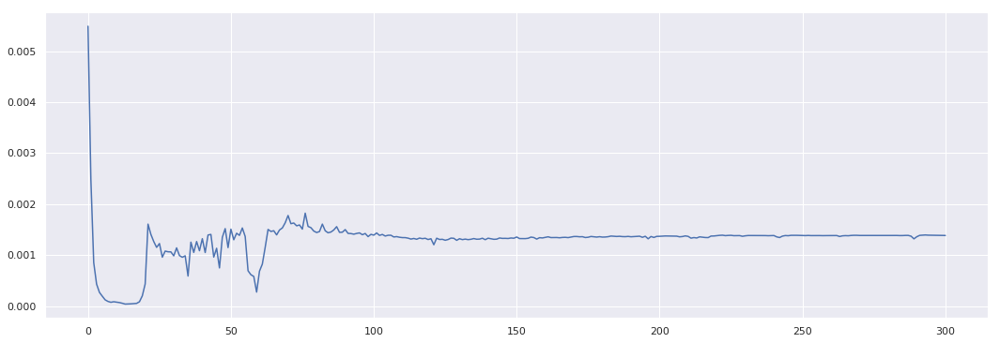

In [23]:
fig = plt.figure(figsize = (18,6))
plt.plot(disrm)

100%|██████████| 180/180 [00:16<00:00, 11.12it/s]


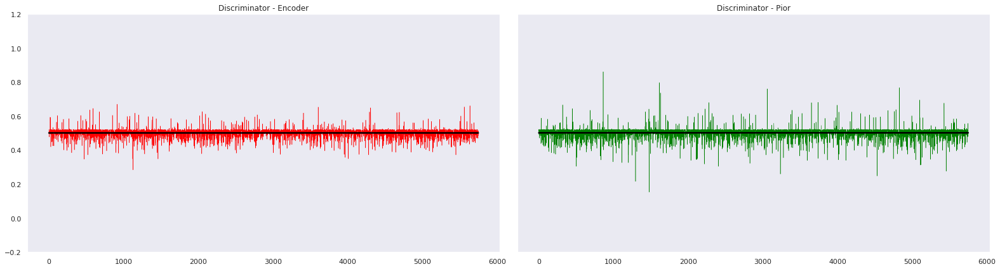

In [24]:
if (time() - start_time) < (5.75 * 3600):
    discrim_real = np.empty(len(train_loader.dataset), dtype = 'f4')
    discrim_fake = np.empty(len(train_loader.dataset), dtype = 'f4')

    pbar = tqdm(train_loader, miniters = 5, leave = True)

    idx = 0

    for batch_idx, (data, target) in enumerate(pbar):

        num_smpl = data.size(0)

        data = data.float() / 255.

        if use_gpu:
            data, target = data.cuda(), target.cuda()

        sample_enc = encoder(data)
        sample_tru = torch.as_tensor(np.random.standard_normal(num_smpl * num_dim).reshape(num_smpl, num_dim).astype('f4')).requires_grad_(True)

        if use_gpu:
            sample_tru = sample_tru.cuda()

        discrim_enc = torch.sigmoid(discriminator(sample_enc))
        discrim_tru = torch.sigmoid(discriminator(sample_tru))

        discrim_real[idx : idx + num_smpl] = discrim_tru.detach().cpu().numpy().ravel()
        discrim_fake[idx : idx + num_smpl] = discrim_enc.detach().cpu().numpy().ravel()

        idx += num_smpl
        
        
    fig, ax = plt.subplots(figsize=(22,6), ncols = 2, nrows = 1, sharey = True)

    ax[0].plot(discrim_fake, color = 'red', linewidth = 0.5)
    ax[1].plot(discrim_real, color = 'green', linewidth = 0.5)

    ax[0].plot(np.ones_like(discrim_fake) * discrim_fake.mean(), color = 'black', linewidth = 2.5)
    ax[1].plot(np.ones_like(discrim_real) * discrim_real.mean(), color = 'black', linewidth = 2.5)

    ax[0].grid()
    ax[1].grid()

    ax[0].set_title("Discriminator - Encoder")
    ax[1].set_title("Discriminator - Pior")

    ax[0].set_ylim([-0.2,1.2])
    plt.tight_layout()